In [1]:
import os
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import numpy as np
import cv2
from PIL import Image
from glob import glob
import skimage.io as io
import shutil

import torch
from torch import nn
from torch.optim import Adam
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
import torchvision as tv
import torch.nn.functional as F
from torch import Tensor

In [2]:
current_path = os.getcwd()
converted_path = current_path.replace('/', '\\')
print(converted_path)

\home\duong\git\DecodeItAll\bio_seman_seg\runet\sessile-main-Kvasir-SEG


In [3]:
bio_seg_dir = "/".join(converted_path.split("\\")[:-2])
print(bio_seg_dir)
print(os.path.exists(bio_seg_dir))

/home/duong/git/DecodeItAll/bio_seman_seg
True


In [4]:
data_dir = bio_seg_dir + "/dataset/sessile-main-Kvasir-SEG"
print(os.listdir(data_dir))

['masks', 'images']


In [5]:
img_dir = data_dir + "/images"
msk_dir = data_dir + "/masks"

print(f"No. Img: {len(os.listdir(img_dir))}")
print(f"No. Msk: {len(os.listdir(msk_dir))}")

No. Img: 196
No. Msk: 196


In [6]:
class PolypDataset(Dataset):
    def __init__(self, transform = None, target_transform = None):
        from glob import glob
        self.imgs = sorted(glob(img_dir + "/*"))
        self.msks = sorted(glob(msk_dir + "/*"))
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        img_path = self.imgs[idx]
        msk_path = self.msks[idx]

        img = Image.open(img_path)
        msk = Image.open(msk_path)

        if self.transform:
            img = self.transform(img)

        if self.target_transform:
            msk = self.target_transform(msk)

        return (img, msk)

In [8]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5757, 0.3280, 0.2384), (0.3077, 0.2093, 0.1699))
])

target_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

ds = PolypDataset(transform=transform, target_transform=target_transform)
train_ds, test_ds = random_split(ds, [0.8, 0.2])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


157


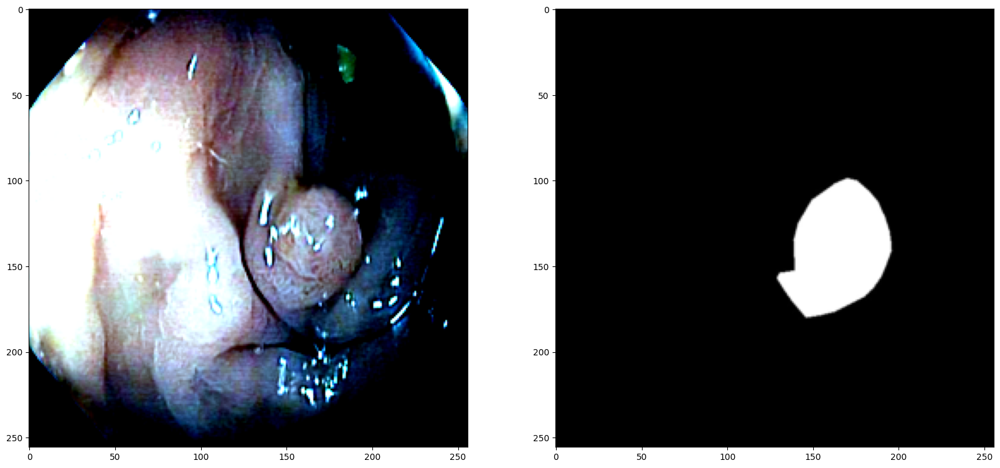

In [9]:
print(len(train_ds))

img, msk = train_ds[25]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20))

ax1.imshow(img.permute(1, -1, 0).numpy())
ax2.imshow(msk.permute(1, -1, 0).numpy(), cmap = 'gray')

In [10]:
train_dl = DataLoader(train_ds, batch_size=20, shuffle=True)

print(len(train_dl))

8


In [11]:
class Recurrent_block(nn.Module):
    def __init__(self, out_ch, t=2):
        super(Recurrent_block, self).__init__()

        self.t = t
        self.out_ch = out_ch
        self.conv = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, kernel_size=3, stride=1, padding=1, bias=True),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        out = 0 
        for i in range(self.t):
            if i == 0:
                x = self.conv(x)
            out = self.conv(x + x)
        return out

In [12]:
class RRCNN_block(nn.Module):
    def __init__(self, in_ch, out_ch, t=2):
        super(RRCNN_block, self).__init__()

        self.RCNN = nn.Sequential(
            Recurrent_block(out_ch, t=t),
            Recurrent_block(out_ch, t=t)
        )
        self.Conv = nn.Conv2d(in_ch, out_ch, kernel_size=1, stride=1, padding=0)

    def forward(self, x):
        x1 = self.Conv(x)
        x2 = self.RCNN(x1)
        out = x1 + x2
        return out

In [13]:
class up_conv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(up_conv, self).__init__()
        self.up = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(in_ch, out_ch, kernel_size=3, stride=1, padding=1, bias=True),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.up(x)
        return x

In [14]:
class R2U_Net(nn.Module):
    """https://arxiv.org/abs/1802.06955"""
    def __init__(self, img_ch=3, output_ch=3, t=2, ini_filter = 16):
        super(R2U_Net, self).__init__()

        n1 = ini_filter
        filters = [n1, n1 * 2, n1 * 4, n1 * 8, n1 * 16]

        self.Maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.Maxpool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.Maxpool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.Maxpool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.Upsample = nn.Upsample(scale_factor=2)

        self.RRCNN1 = RRCNN_block(img_ch, filters[0], t=t)

        self.RRCNN2 = RRCNN_block(filters[0], filters[1], t=t)

        self.RRCNN3 = RRCNN_block(filters[1], filters[2], t=t)

        self.RRCNN4 = RRCNN_block(filters[2], filters[3], t=t)

        self.RRCNN5 = RRCNN_block(filters[3], filters[4], t=t)

        self.Up5 = up_conv(filters[4], filters[3])
        self.Up_RRCNN5 = RRCNN_block(filters[4], filters[3], t=t)

        self.Up4 = up_conv(filters[3], filters[2])
        self.Up_RRCNN4 = RRCNN_block(filters[3], filters[2], t=t)

        self.Up3 = up_conv(filters[2], filters[1])
        self.Up_RRCNN3 = RRCNN_block(filters[2], filters[1], t=t)

        self.Up2 = up_conv(filters[1], filters[0])
        self.Up_RRCNN2 = RRCNN_block(filters[1], filters[0], t=t)

        self.Conv = nn.Conv2d(filters[0], output_ch, kernel_size=1, stride=1, padding=0)
    def forward(self, x):

        e1 = self.RRCNN1(x)

        e2 = self.Maxpool(e1)
        e2 = self.RRCNN2(e2)

        e3 = self.Maxpool1(e2)
        e3 = self.RRCNN3(e3)

        e4 = self.Maxpool2(e3)
        e4 = self.RRCNN4(e4)

        e5 = self.Maxpool3(e4)
        e5 = self.RRCNN5(e5)

        d5 = self.Up5(e5)
        d5 = torch.cat((e4, d5), dim=1)
        d5 = self.Up_RRCNN5(d5)

        d4 = self.Up4(d5)
        d4 = torch.cat((e3, d4), dim=1)
        d4 = self.Up_RRCNN4(d4)

        d3 = self.Up3(d4)
        d3 = torch.cat((e2, d3), dim=1)
        d3 = self.Up_RRCNN3(d3)

        d2 = self.Up2(d3)
        d2 = torch.cat((e1, d2), dim=1)
        d2 = self.Up_RRCNN2(d2)

        out = self.Conv(d2)      

        return out

In [15]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu", index = 0)

model = R2U_Net(3, 1, False).to(device)

optimizer = Adam(params = model.parameters(), lr = 0.001)

epochs = 100

loss_fn = nn.BCEWithLogitsLoss()

In [20]:
old_loss = 1e26
best_dct = None
last_dct = None
for epoch in range(epochs):
    model.train()
    tr_total_loss = 0
    tr_total_dice = 0
    tr_total_iou = 0
    for train_img, train_mask in tqdm(train_dl):
        train_img = train_img.to(device)
        train_mask = train_mask.to(device)

        train_gen_mask = model(train_img)        
        train_loss = loss_fn(train_gen_mask, train_mask)

        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()        
        
        tr_total_loss += train_loss.cpu().item()        
            
    mean_train_loss = tr_total_loss/len(train_dl)

    if mean_train_loss <= old_loss:
        old_loss = mean_train_loss
        best_dct = model.state_dict()
    
    last_dct = model.state_dict()

    print(f"Epoch: {epoch} - TrainLoss: {mean_train_loss}")
model.load_state_dict(best_dct)

100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.07it/s]


Epoch: 0 - TrainLoss: 0.17814406007528305


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.27it/s]


Epoch: 1 - TrainLoss: 0.17754868045449257


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.15it/s]


Epoch: 2 - TrainLoss: 0.17996864393353462


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.30it/s]


Epoch: 3 - TrainLoss: 0.18065686896443367


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.23it/s]


Epoch: 4 - TrainLoss: 0.17159593850374222


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.35it/s]


Epoch: 5 - TrainLoss: 0.1791546680033207


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.30it/s]


Epoch: 6 - TrainLoss: 0.17735346406698227


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.32it/s]


Epoch: 7 - TrainLoss: 0.17379479855298996


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.25it/s]


Epoch: 8 - TrainLoss: 0.17840442433953285


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.30it/s]


Epoch: 9 - TrainLoss: 0.18189282063394785


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.32it/s]


Epoch: 10 - TrainLoss: 0.17449932731688023


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.28it/s]


Epoch: 11 - TrainLoss: 0.16966462694108486


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.27it/s]


Epoch: 12 - TrainLoss: 0.17280983179807663


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.22it/s]


Epoch: 13 - TrainLoss: 0.16959121637046337


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.26it/s]


Epoch: 14 - TrainLoss: 0.17199769522994757


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.20it/s]


Epoch: 15 - TrainLoss: 0.1689928937703371


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.20it/s]


Epoch: 16 - TrainLoss: 0.16963832452893257


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.19it/s]


Epoch: 17 - TrainLoss: 0.1650067549198866


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.33it/s]


Epoch: 18 - TrainLoss: 0.17893663235008717


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.34it/s]


Epoch: 19 - TrainLoss: 0.17354692425578833


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.30it/s]


Epoch: 20 - TrainLoss: 0.16715840250253677


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.27it/s]


Epoch: 21 - TrainLoss: 0.17408222425729036


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.12it/s]


Epoch: 22 - TrainLoss: 0.16816052235662937


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.36it/s]


Epoch: 23 - TrainLoss: 0.1634391574189067


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.39it/s]


Epoch: 24 - TrainLoss: 0.1635226020589471


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.20it/s]


Epoch: 25 - TrainLoss: 0.18395275343209505


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.35it/s]


Epoch: 26 - TrainLoss: 0.16947024874389172


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.35it/s]


Epoch: 27 - TrainLoss: 0.16589298471808434


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.34it/s]


Epoch: 28 - TrainLoss: 0.16572822537273169


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.21it/s]


Epoch: 29 - TrainLoss: 0.16073412168771029


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.35it/s]


Epoch: 30 - TrainLoss: 0.1646775919944048


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.12it/s]


Epoch: 31 - TrainLoss: 0.16470373421907425


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.29it/s]


Epoch: 32 - TrainLoss: 0.16381872165948153


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.19it/s]


Epoch: 33 - TrainLoss: 0.16719194315373898


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.27it/s]


Epoch: 34 - TrainLoss: 0.16177523229271173


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.25it/s]


Epoch: 35 - TrainLoss: 0.15574342850595713


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.36it/s]


Epoch: 36 - TrainLoss: 0.16125265322625637


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.09it/s]


Epoch: 37 - TrainLoss: 0.15499381348490715


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.33it/s]


Epoch: 38 - TrainLoss: 0.15565763507038355


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.38it/s]


Epoch: 39 - TrainLoss: 0.16167799197137356


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.29it/s]


Epoch: 40 - TrainLoss: 0.15417099557816982


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.09it/s]


Epoch: 41 - TrainLoss: 0.15352382231503725


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.25it/s]


Epoch: 42 - TrainLoss: 0.1629673782736063


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.25it/s]


Epoch: 43 - TrainLoss: 0.16101255547255278


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.18it/s]


Epoch: 44 - TrainLoss: 0.15317712537944317


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.37it/s]


Epoch: 45 - TrainLoss: 0.15157203003764153


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.32it/s]


Epoch: 46 - TrainLoss: 0.15189155284315348


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.33it/s]


Epoch: 47 - TrainLoss: 0.15555951092392206


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.22it/s]


Epoch: 48 - TrainLoss: 0.15062059368938208


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.36it/s]


Epoch: 49 - TrainLoss: 0.15245904307812452


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.35it/s]


Epoch: 50 - TrainLoss: 0.15174921229481697


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.32it/s]


Epoch: 51 - TrainLoss: 0.1619013212621212


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.11it/s]


Epoch: 52 - TrainLoss: 0.1489661205559969


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.30it/s]


Epoch: 53 - TrainLoss: 0.14617861341685057


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.23it/s]


Epoch: 54 - TrainLoss: 0.15105813834816217


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.39it/s]


Epoch: 55 - TrainLoss: 0.14476192463189363


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.32it/s]


Epoch: 56 - TrainLoss: 0.1407880550250411


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.34it/s]


Epoch: 57 - TrainLoss: 0.14098972640931606


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.18it/s]


Epoch: 58 - TrainLoss: 0.16124094650149345


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.26it/s]


Epoch: 59 - TrainLoss: 0.152755593881011


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.22it/s]


Epoch: 60 - TrainLoss: 0.14697666838765144


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.26it/s]


Epoch: 61 - TrainLoss: 0.15006304811686277


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.31it/s]


Epoch: 62 - TrainLoss: 0.1451250622048974


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.20it/s]


Epoch: 63 - TrainLoss: 0.1519301813095808


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.24it/s]


Epoch: 64 - TrainLoss: 0.15173002798110247


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.07it/s]


Epoch: 65 - TrainLoss: 0.14016248658299446


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.09it/s]


Epoch: 66 - TrainLoss: 0.1353039387613535


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.18it/s]


Epoch: 67 - TrainLoss: 0.1397151593118906


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.38it/s]


Epoch: 68 - TrainLoss: 0.15155975800007582


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.14it/s]


Epoch: 69 - TrainLoss: 0.14775059837847948


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.17it/s]


Epoch: 70 - TrainLoss: 0.14129762072116137


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.18it/s]


Epoch: 71 - TrainLoss: 0.14201509300619364


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.21it/s]


Epoch: 72 - TrainLoss: 0.12717376090586185


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.22it/s]


Epoch: 73 - TrainLoss: 0.14037489891052246


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.24it/s]


Epoch: 74 - TrainLoss: 0.154552829451859


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.25it/s]


Epoch: 75 - TrainLoss: 0.14703141897916794


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.23it/s]


Epoch: 76 - TrainLoss: 0.14662431739270687


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.35it/s]


Epoch: 77 - TrainLoss: 0.14226599782705307


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.31it/s]


Epoch: 78 - TrainLoss: 0.13513917196542025


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.08it/s]


Epoch: 79 - TrainLoss: 0.13698061276227236


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.23it/s]


Epoch: 80 - TrainLoss: 0.13475669920444489


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.16it/s]


Epoch: 81 - TrainLoss: 0.13728535920381546


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.22it/s]


Epoch: 82 - TrainLoss: 0.13332627899944782


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.24it/s]


Epoch: 83 - TrainLoss: 0.1264786059036851


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.15it/s]


Epoch: 84 - TrainLoss: 0.11817156244069338


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.20it/s]


Epoch: 85 - TrainLoss: 0.11731134913861752


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.19it/s]


Epoch: 86 - TrainLoss: 0.122582683339715


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.21it/s]


Epoch: 87 - TrainLoss: 0.13545560091733932


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.09it/s]


Epoch: 88 - TrainLoss: 0.13157580140978098


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.14it/s]


Epoch: 89 - TrainLoss: 0.12599857617169619


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.24it/s]


Epoch: 90 - TrainLoss: 0.12833034992218018


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.30it/s]


Epoch: 91 - TrainLoss: 0.12221665773540735


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.25it/s]


Epoch: 92 - TrainLoss: 0.12222682312130928


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.40it/s]


Epoch: 93 - TrainLoss: 0.12408143747597933


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.28it/s]


Epoch: 94 - TrainLoss: 0.12407944444566965


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.35it/s]


Epoch: 95 - TrainLoss: 0.11971052549779415


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.26it/s]


Epoch: 96 - TrainLoss: 0.11401904840022326


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.34it/s]


Epoch: 97 - TrainLoss: 0.11591758672147989


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.18it/s]


Epoch: 98 - TrainLoss: 0.11967682652175426


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00,  9.26it/s]

Epoch: 99 - TrainLoss: 0.12501491326838732


<All keys matched successfully>

In [23]:
test_dl = DataLoader(test_ds, batch_size=1, shuffle=True)

print(len(test_dl))

39


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


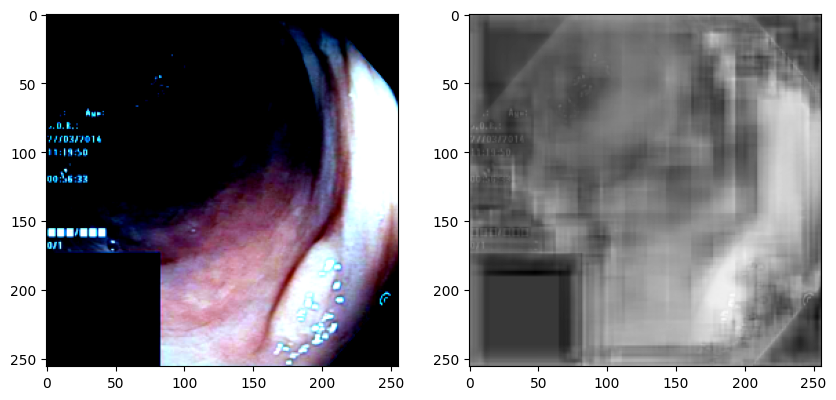

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


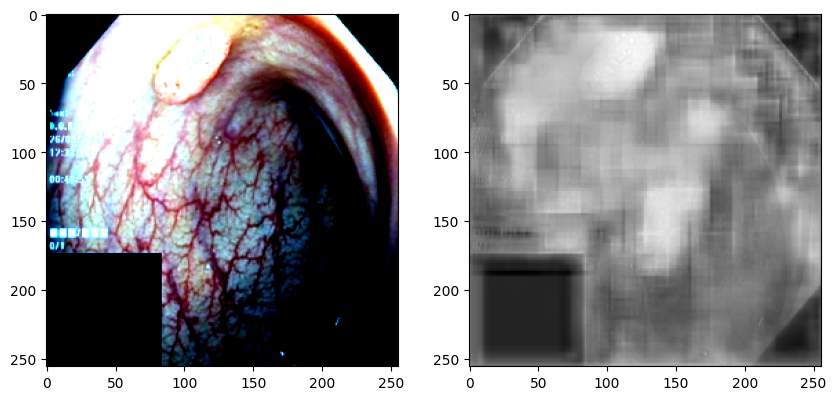

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


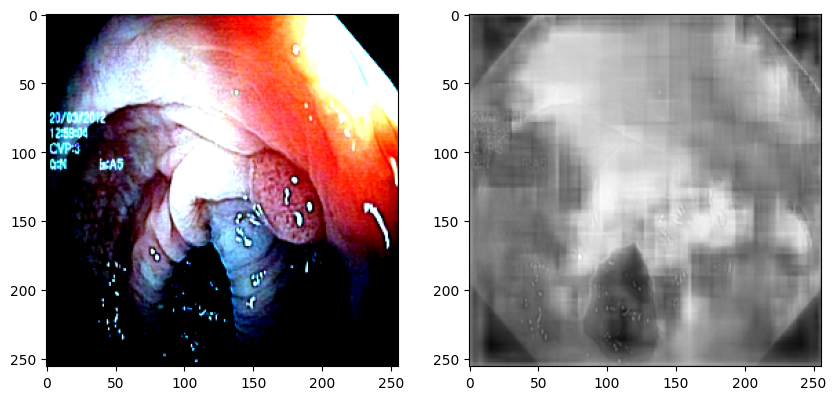

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


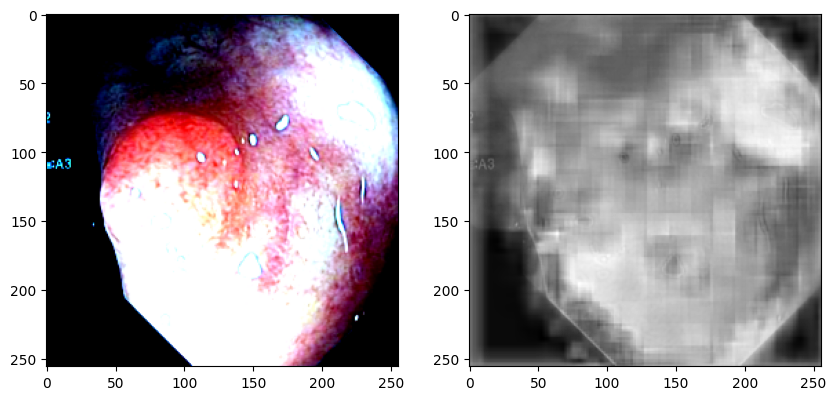

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


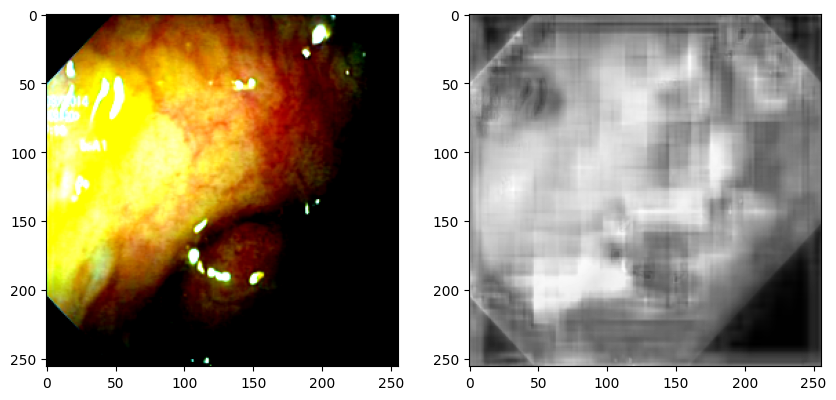

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


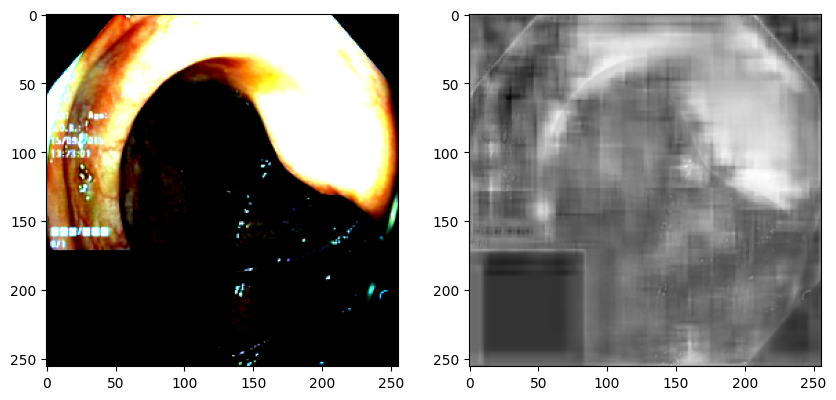

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


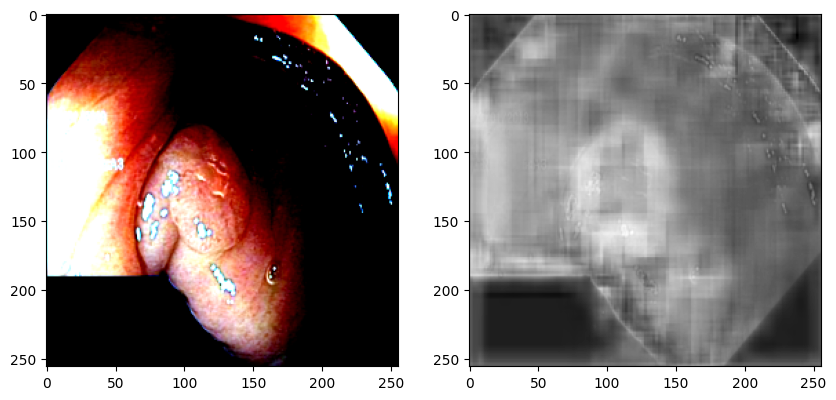

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


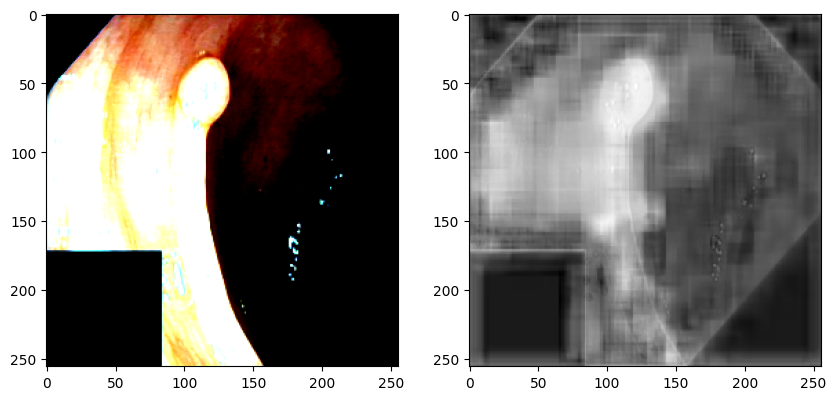

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


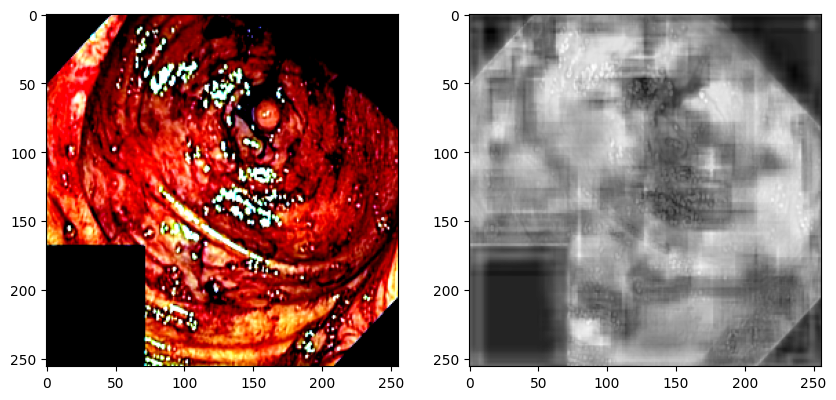

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


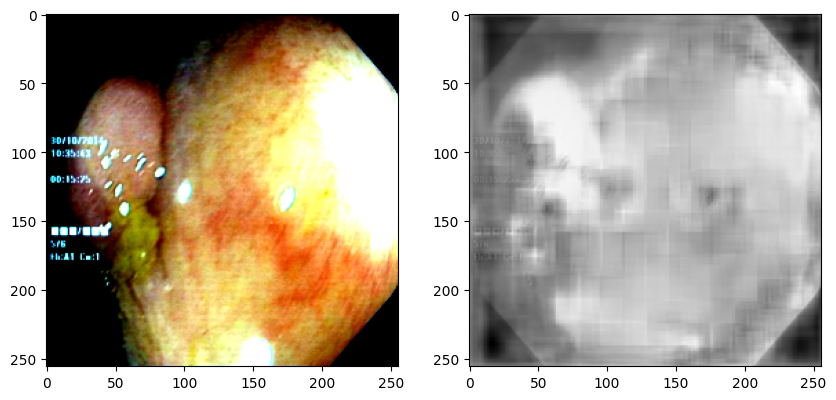

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


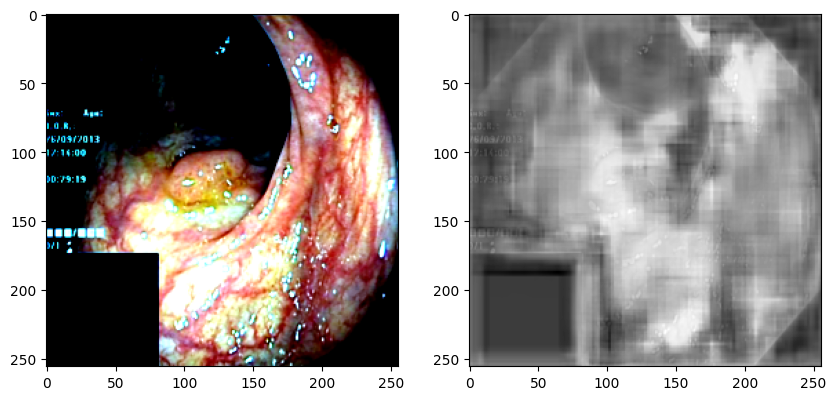

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


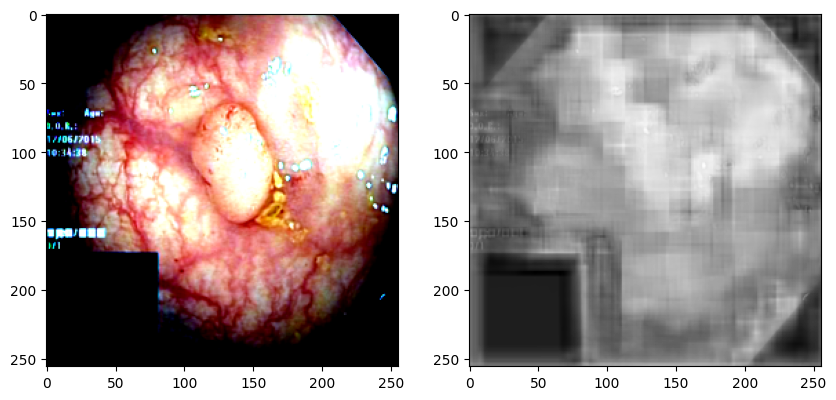

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


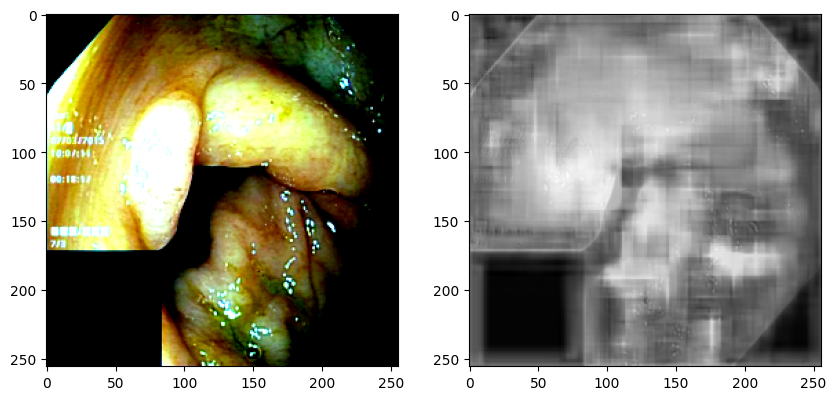

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


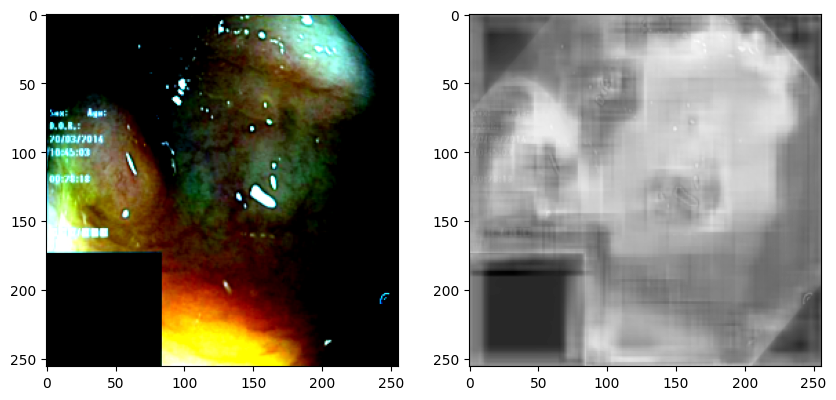

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


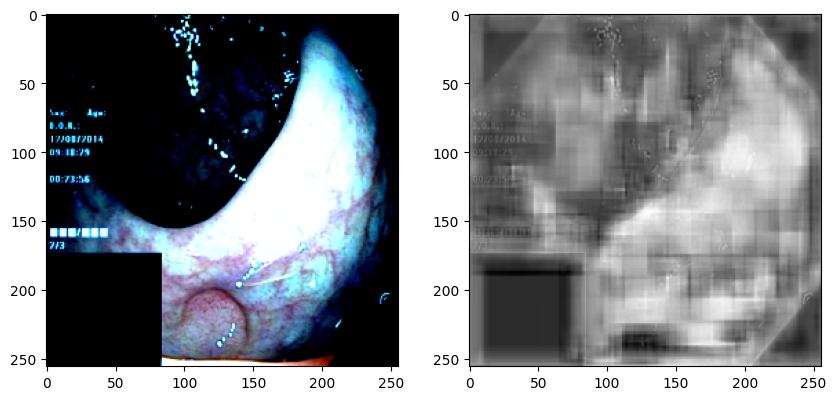

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


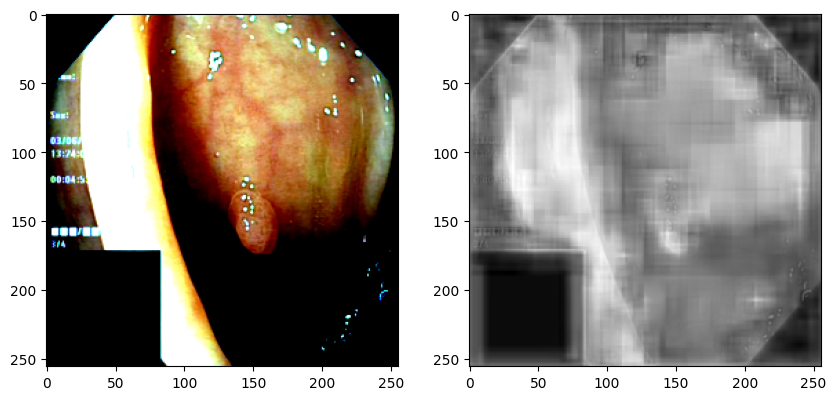

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


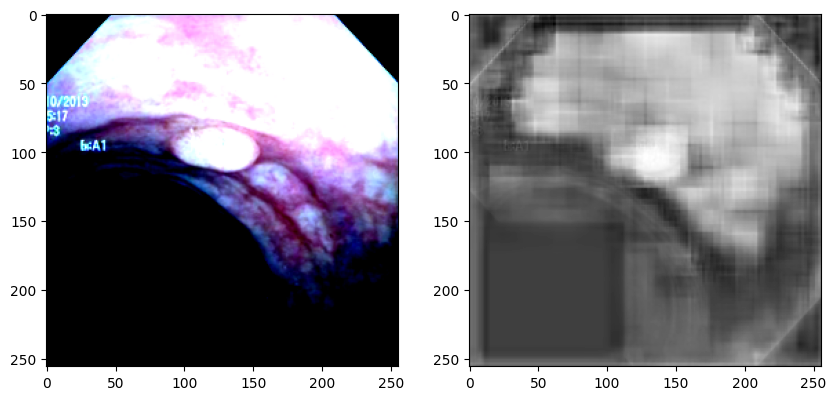

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


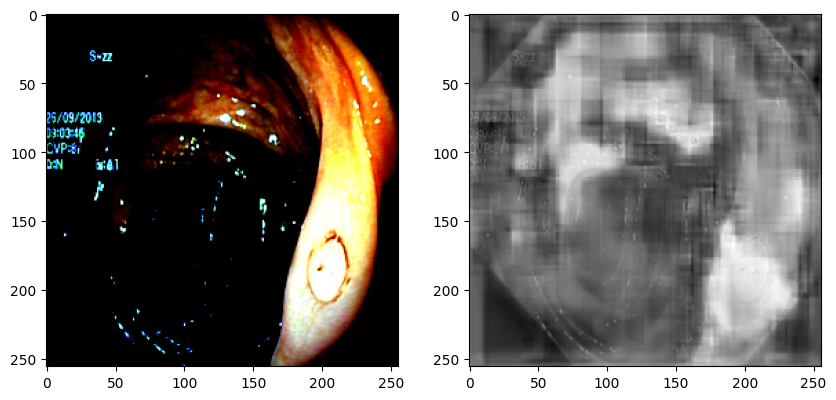

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


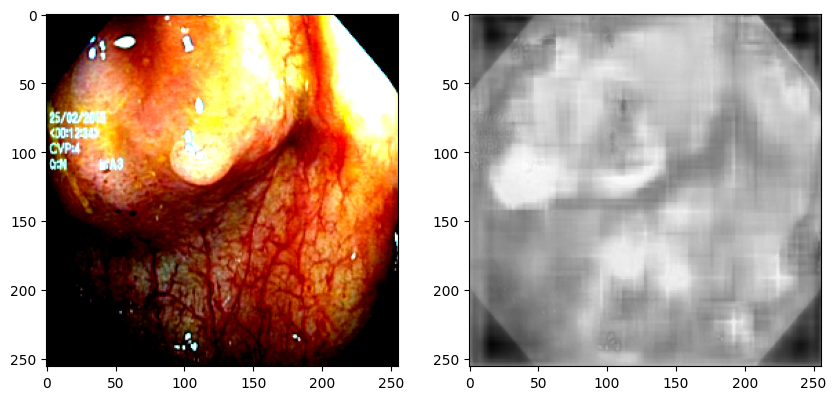

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


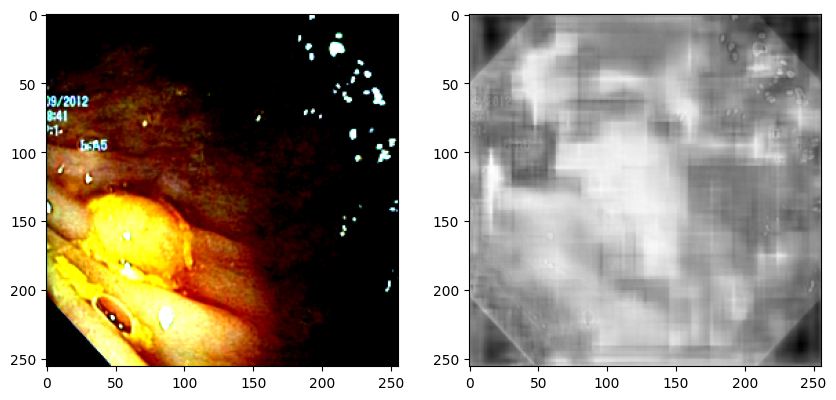

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


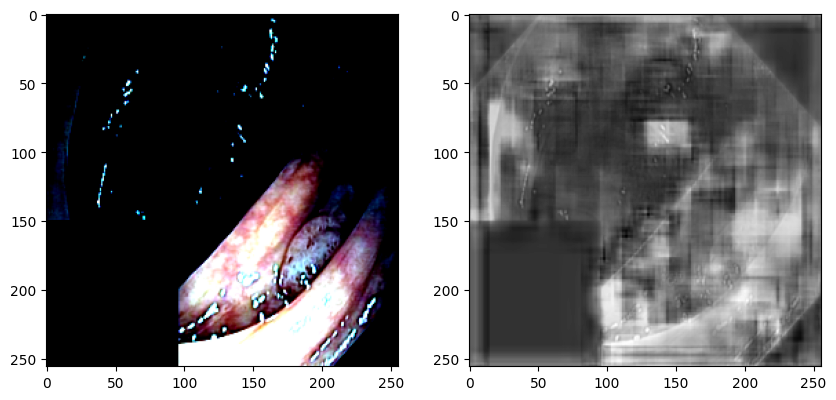

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


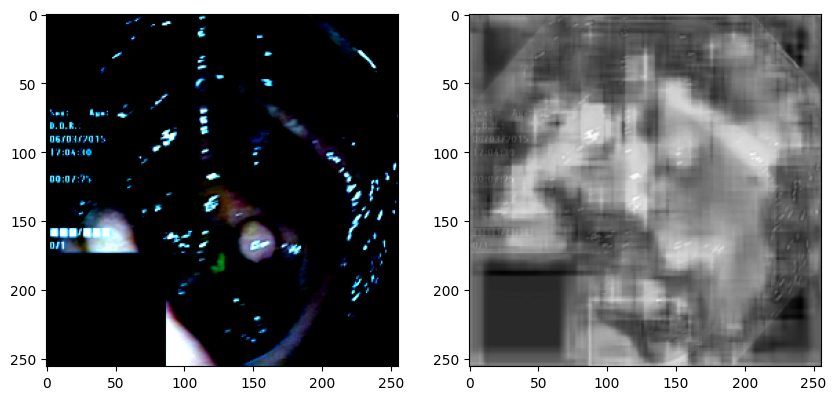

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


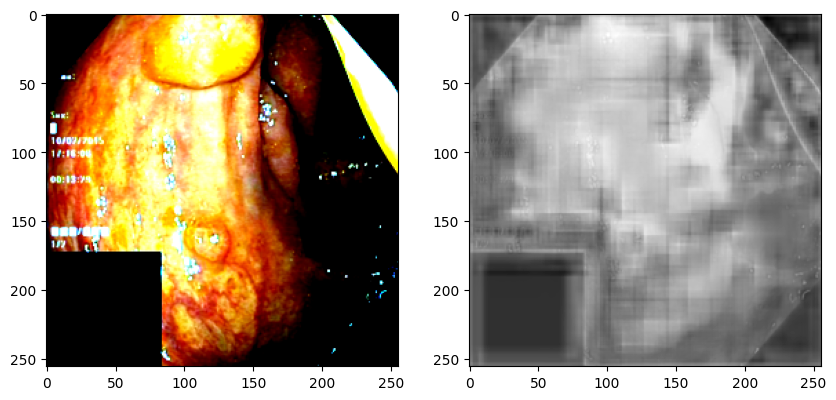

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


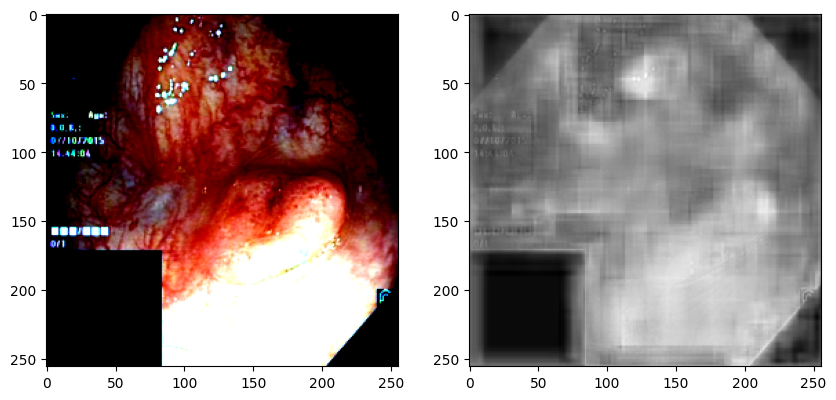

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


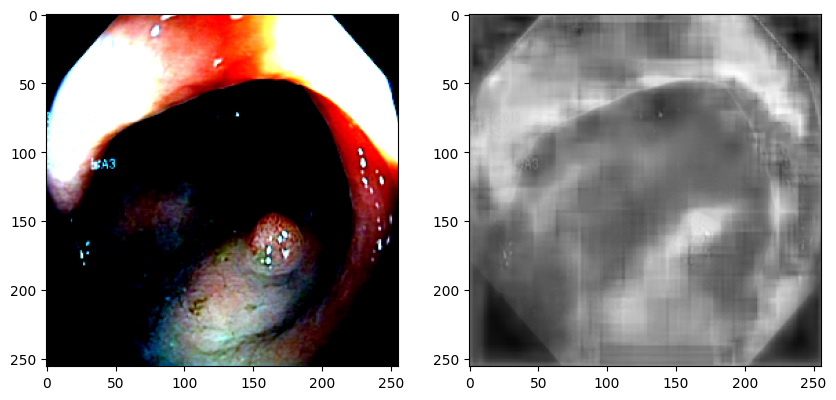

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


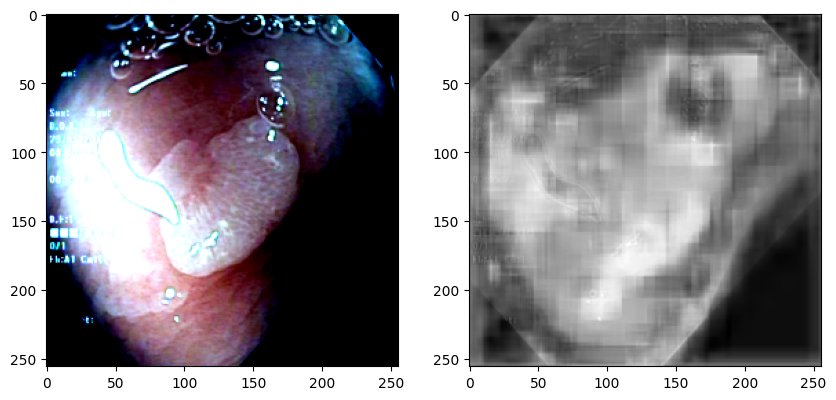

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


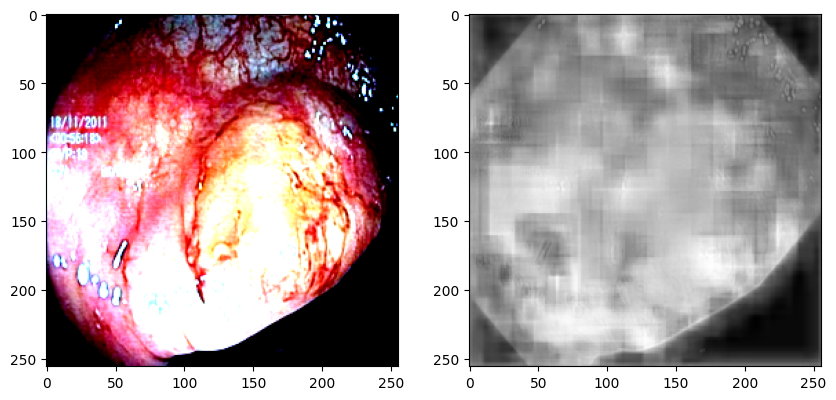

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


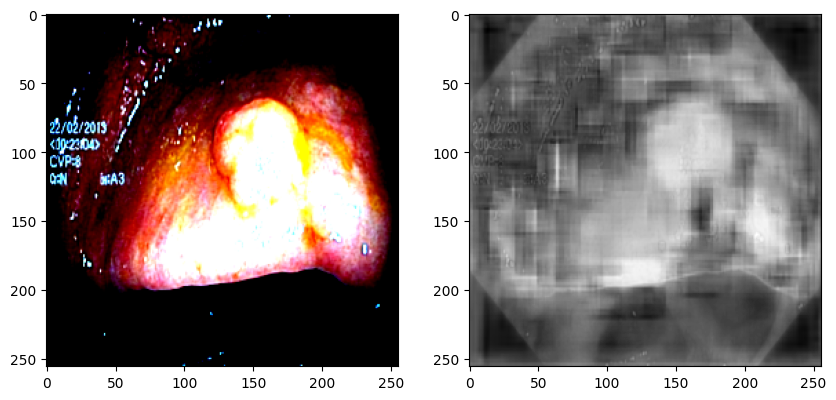

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


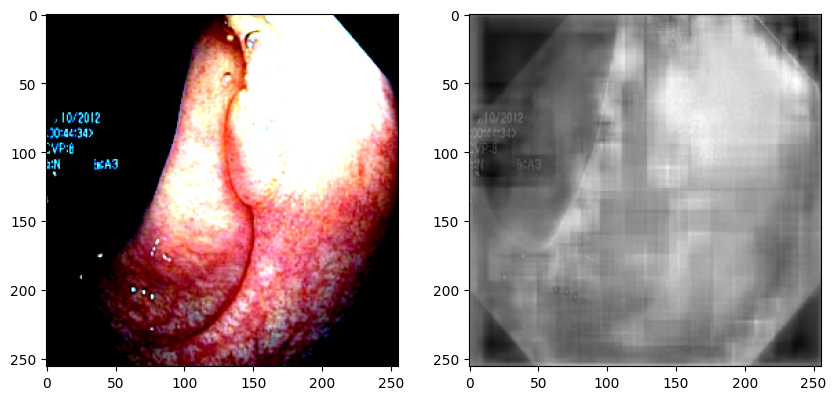

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


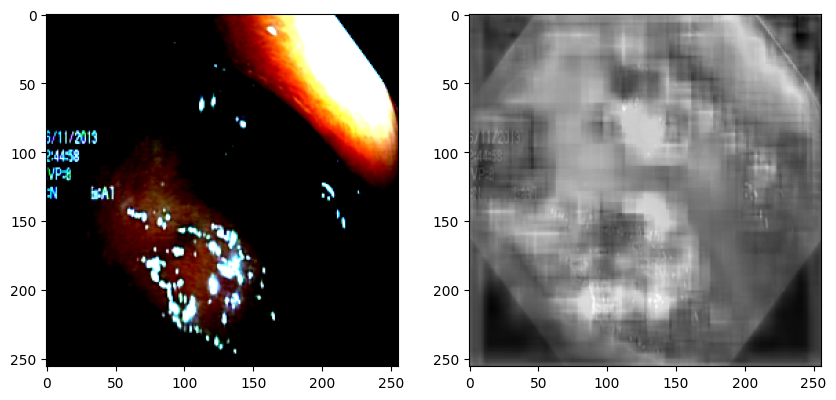

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


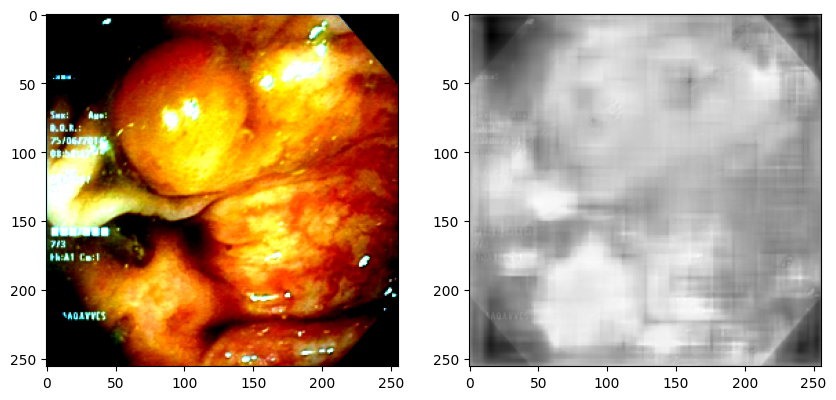

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


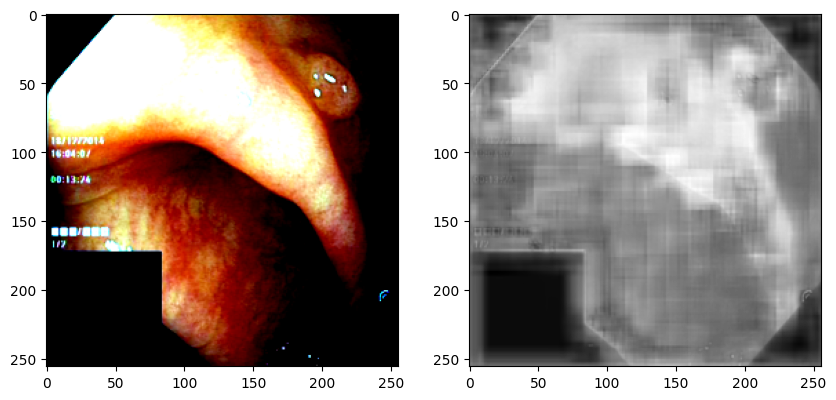

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


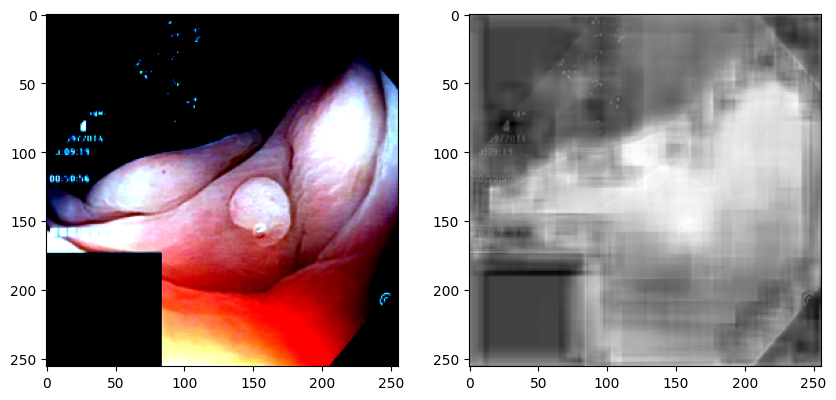

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


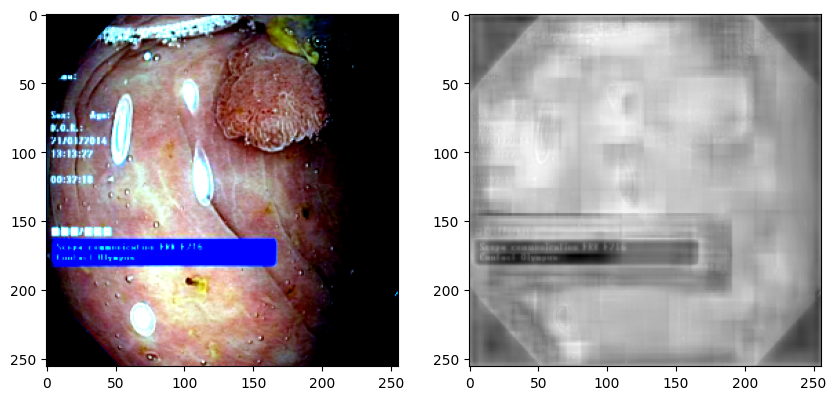

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


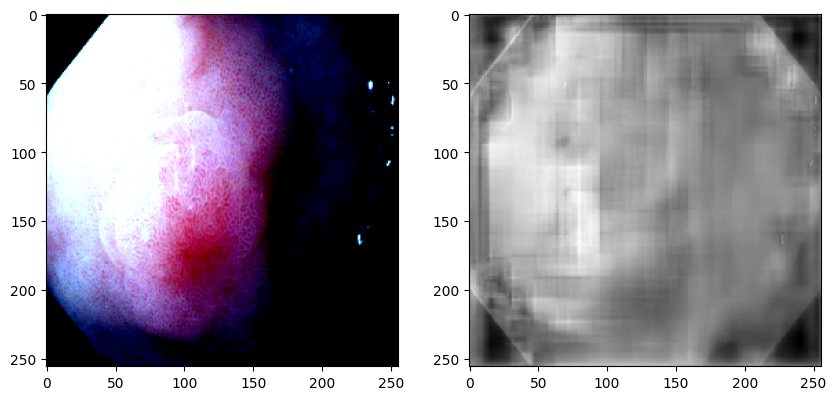

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


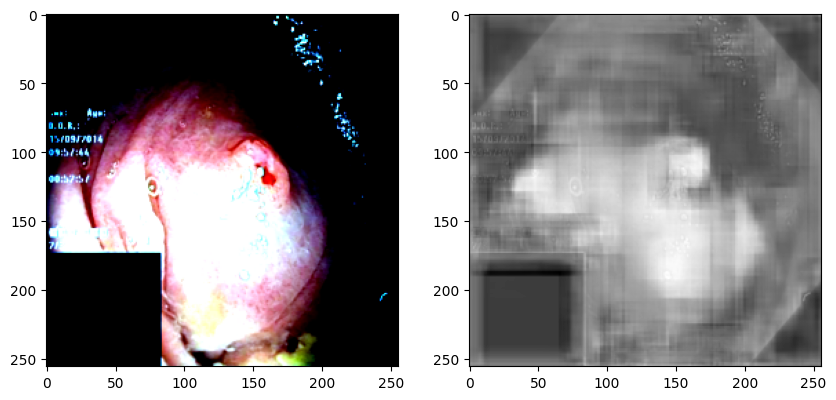

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


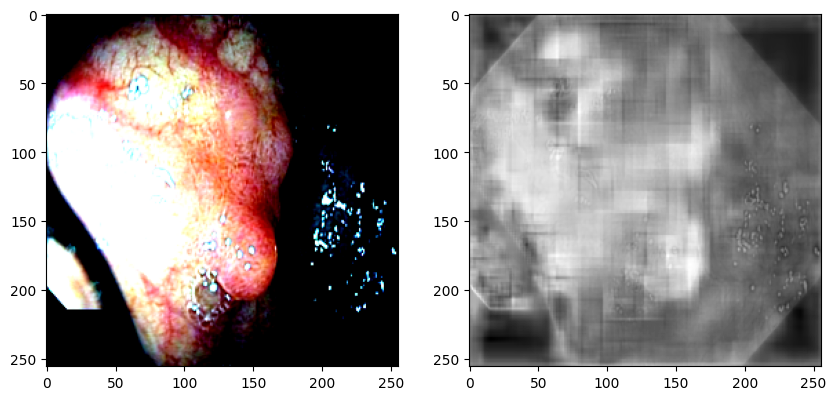

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


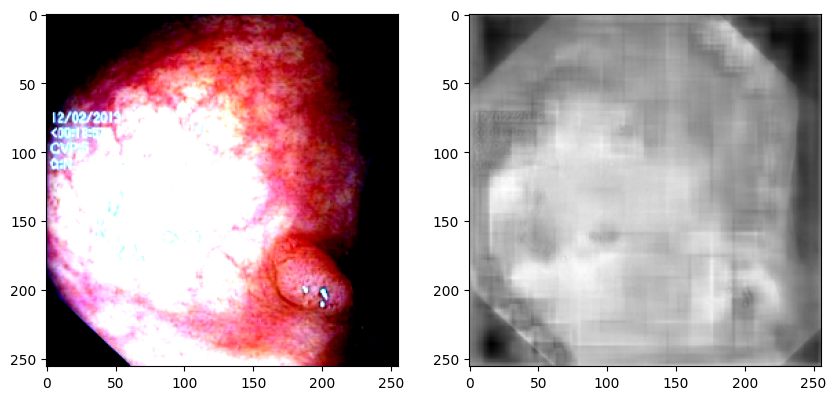

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


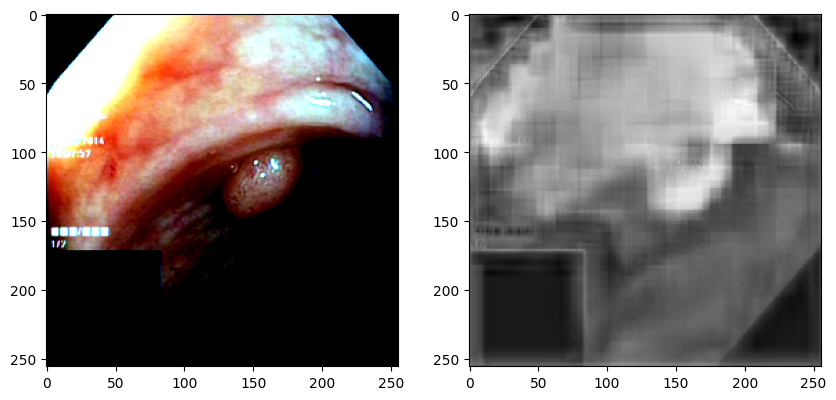

In [24]:
from glob import glob
for img, _ in test_dl:
    img = img.to(device)

    mask = model(img)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))

    ax1.imshow(img[0].permute(1, -1, 0).detach().cpu().numpy())
    ax2.imshow(mask[0].permute(1, -1, 0).detach().cpu().numpy(), cmap = 'gray')

    plt.show()  
    plt.close()